<a href="https://colab.research.google.com/github/vidhishah22/CMPE-297-EmergingTech/blob/master/Dog_Breed_Classifier_With_Visualization.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Assignment 3 : State of art dog breed classifier + Visualization + Tensorboard**
***
**Submission By: Vidhi Shah**


In [0]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


# Import Libraries

In [0]:
import os
import pandas as pd
import re
import matplotlib.pyplot as plt
import seaborn as sns
from google.colab import files
# try:
#   # %tensorflow_version only exists in Colab.
#   %tensorflow_version 2.x
# except Exception:
#   pass
import tensorflow as tf
# Load the TensorBoard notebook extension
%load_ext tensorboard
# !pip install tensorflow==2.0
# !pip install tensorboard

In [0]:
!pip3 show tensorflow

Name: tensorflow
Version: 1.15.0
Summary: TensorFlow is an open source machine learning framework for everyone.
Home-page: https://www.tensorflow.org/
Author: Google Inc.
Author-email: packages@tensorflow.org
License: Apache 2.0
Location: /usr/local/lib/python3.6/dist-packages
Requires: keras-preprocessing, tensorboard, numpy, opt-einsum, keras-applications, six, gast, google-pasta, protobuf, termcolor, astor, wrapt, wheel, grpcio, absl-py, tensorflow-estimator
Required-by: stable-baselines, magenta, fancyimpute


In [0]:
#!pip install kaggle
api_token = {"username":"vidhishah22","key":"ff9d8cf0d21e1c71279fc09c4b463d1d"}

#Import DataSets

In [0]:
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"vidhishah22","key":"ff9d8cf0d21e1c71279fc09c4b463d1d"}'}

In [0]:
!ls kaggle.json

kaggle.json


In [0]:
!ls

drive  kaggle.json  sample_data


In [0]:
!pwd

/content


In [0]:
!mkdir -p ~/.kaggle

In [0]:
!cp kaggle.json ~/.kaggle/

In [0]:
!chmod 600 ~/.kaggle/kaggle.json

In [0]:
!kaggle competitions download -c dog-breed-identification

  0% 0.00/214k [00:00<?, ?B/s]
100% 214k/214k [00:00<00:00, 83.5MB/s]
  0% 0.00/281k [00:00<?, ?B/s]
100% 281k/281k [00:00<00:00, 87.6MB/s]
 97% 336M/346M [00:03<00:00, 67.6MB/s]
100% 346M/346M [00:03<00:00, 95.6MB/s]
 96% 331M/345M [00:03<00:00, 86.7MB/s]
100% 345M/345M [00:03<00:00, 104MB/s] 


In [0]:
os.chdir('/content')

In [0]:
!ls -lra

total 707580
-rw-r--r-- 1 root root 361279070 Nov 17 01:35 train.zip
-rw-r--r-- 1 root root 362738853 Nov 17 01:34 test.zip
-rw-r--r-- 1 root root    288160 Nov 17 01:34 sample_submission.csv.zip
drwxr-xr-x 1 root root      4096 Nov  6 16:17 sample_data
-rw-r--r-- 1 root root    218954 Nov 17 01:34 labels.csv.zip
-rw-r--r-- 1 root root        67 Nov 17 01:34 kaggle.json
drwx------ 4 root root      4096 Nov 17 01:31 drive
drwxr-xr-x 1 root root      4096 Nov 12 16:16 .config
drwxr-xr-x 1 root root      4096 Nov 17 01:29 ..
drwxr-xr-x 1 root root      4096 Nov 17 01:35 .


In [0]:
!unzip '/content/*.zip'

Archive:  /content/train.zip
   creating: train/
  inflating: train/000bec180eb18c7604dcecc8fe0dba07.jpg  
  inflating: train/001513dfcb2ffafc82cccf4d8bbaba97.jpg  
  inflating: train/001cdf01b096e06d78e9e5112d419397.jpg  
  inflating: train/00214f311d5d2247d5dfe4fe24b2303d.jpg  
  inflating: train/0021f9ceb3235effd7fcde7f7538ed62.jpg  
  inflating: train/002211c81b498ef88e1b40b9abf84e1d.jpg  
  inflating: train/00290d3e1fdd27226ba27a8ce248ce85.jpg  
  inflating: train/002a283a315af96eaea0e28e7163b21b.jpg  
  inflating: train/003df8b8a8b05244b1d920bb6cf451f9.jpg  
  inflating: train/0042188c895a2f14ef64a918ed9c7b64.jpg  
  inflating: train/004396df1acd0f1247b740ca2b14616e.jpg  
  inflating: train/0067dc3eab0b3c3ef0439477624d85d6.jpg  
  inflating: train/00693b8bc2470375cc744a6391d397ec.jpg  
  inflating: train/006cc3ddb9dc1bd827479569fcdc52dc.jpg  
  inflating: train/0075dc49dab4024d12fafe67074d8a81.jpg  
  inflating: train/00792e341f3c6eb33663e415d0715370.jpg  
  inflating: train/007b

#Model Training & Prediction

In [0]:
import tensorflow as tf
import datetime

In [0]:
# Clear any logs from previous runs
!rm -rf ./logs/ 

In [0]:
from tensorflow.keras.preprocessing import *
# from keras.applications.vgg16 import VGG16
# from keras.applications.resnet50 import ResNet50
# from keras.applications import xception
# from keras.applications import inception_v3
# from keras.applications.vgg16 import preprocess_input, decode_predictions
# from sklearn.linear_model import LogisticRegression

In [0]:
%matplotlib inline
import numpy as np
import pandas as pd
import datetime as dt
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid
from os import listdir, makedirs
from os.path import join, exists, expanduser
from tqdm import tqdm
from sklearn.metrics import log_loss, accuracy_score
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.applications import xception
from tensorflow.keras.applications import inception_v3
from tensorflow.keras.applications.vgg16 import preprocess_input, decode_predictions
from sklearn.linear_model import LogisticRegression

## Downloading Pre-Trained Keras Models

In [0]:
!kaggle datasets download -d gaborfodor/keras-pretrained-models

 98% 929M/943M [00:11<00:00, 110MB/s]
100% 943M/943M [00:11<00:00, 89.0MB/s]


In [0]:
!unzip "/content/keras-pretrained-models.zip"

Archive:  /content/keras-pretrained-models.zip
  inflating: Kuszma.JPG              
  inflating: imagenet_class_index.json  
  inflating: inception_resnet_v2_weights_tf_dim_ordering_tf_kernels.h5  
  inflating: inception_resnet_v2_weights_tf_dim_ordering_tf_kernels_notop.h5  
  inflating: inception_v3_weights_tf_dim_ordering_tf_kernels.h5  
  inflating: inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5  
  inflating: resnet50_weights_tf_dim_ordering_tf_kernels.h5  
  inflating: resnet50_weights_tf_dim_ordering_tf_kernels_notop.h5  
  inflating: vgg16_weights_tf_dim_ordering_tf_kernels_notop.h5  
  inflating: xception_weights_tf_dim_ordering_tf_kernels.h5  
  inflating: xception_weights_tf_dim_ordering_tf_kernels_notop.h5  


In [0]:
!mkdir -p keras-pretrained-models

In [0]:
!mv *.h5 keras-pretrained-models

In [0]:
!mv /content/imagenet_class_index.json keras-pretrained-models
!mv /content/Kuszma.JPG keras-pretrained-models

In [0]:
!ls keras-pretrained-models/

imagenet_class_index.json
inception_resnet_v2_weights_tf_dim_ordering_tf_kernels.h5
inception_resnet_v2_weights_tf_dim_ordering_tf_kernels_notop.h5
inception_v3_weights_tf_dim_ordering_tf_kernels.h5
inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5
Kuszma.JPG
resnet50_weights_tf_dim_ordering_tf_kernels.h5
resnet50_weights_tf_dim_ordering_tf_kernels_notop.h5
vgg16_weights_tf_dim_ordering_tf_kernels_notop.h5
xception_weights_tf_dim_ordering_tf_kernels.h5
xception_weights_tf_dim_ordering_tf_kernels_notop.h5


In [0]:
from os.path import join, exists, expanduser
from os import listdir, makedirs
cache_dir = expanduser(join('~', '.torch'))
if not exists(cache_dir):
    makedirs(cache_dir)
models_dir = join(cache_dir, 'models')
if not exists(models_dir):
    makedirs(models_dir)

In [0]:
!cp keras-pretrained-models/* ~/.torch/models/

In [0]:
!ls -ltr ~/.torch/models

total 1043700
-rw-r--r-- 1 root root     35363 Nov 17 01:44 imagenet_class_index.json
-rw-r--r-- 1 root root 225209952 Nov 17 01:44 inception_resnet_v2_weights_tf_dim_ordering_tf_kernels.h5
-rw-r--r-- 1 root root 219055592 Nov 17 01:44 inception_resnet_v2_weights_tf_dim_ordering_tf_kernels_notop.h5
-rw-r--r-- 1 root root  96112376 Nov 17 01:44 inception_v3_weights_tf_dim_ordering_tf_kernels.h5
-rw-r--r-- 1 root root  87910968 Nov 17 01:44 inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5
-rw-r--r-- 1 root root   8442793 Nov 17 01:44 Kuszma.JPG
-rw-r--r-- 1 root root 102853048 Nov 17 01:44 resnet50_weights_tf_dim_ordering_tf_kernels.h5
-rw-r--r-- 1 root root  94653016 Nov 17 01:44 resnet50_weights_tf_dim_ordering_tf_kernels_notop.h5
-rw-r--r-- 1 root root  58889256 Nov 17 01:44 vgg16_weights_tf_dim_ordering_tf_kernels_notop.h5
-rw-r--r-- 1 root root  91884032 Nov 17 01:44 xception_weights_tf_dim_ordering_tf_kernels.h5
-rw-r--r-- 1 root root  83683744 Nov 17 01:44 xception_weights

In [0]:
log_dir="logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

##Resnet50

In [0]:
INPUT_SIZE = 224
NUM_CLASSES = 16
SEED = 1987
data_dir = '/content/'
labels = pd.read_csv(join(data_dir, 'labels.csv'))
sample_submission = pd.read_csv(join(data_dir, 'sample_submission.csv'))
print(len(listdir(join(data_dir, 'train'))), len(labels))
print(len(listdir(join(data_dir, 'test'))), len(sample_submission))

10222 10222
10357 10357


In [0]:
import numpy as np
selected_breed_list = list(labels.groupby('breed').count().sort_values(by='id', ascending=False).head(NUM_CLASSES).index)
labels = labels[labels['breed'].isin(selected_breed_list)]
labels['target'] = 1
labels['rank'] = labels.groupby('breed')['id'].apply(lambda x: x.rank())
labels_pivot = labels.pivot('id', 'breed', 'target').reset_index().fillna(0)
np.random.seed(seed=SEED)
rnd = np.random.random(len(labels))
train_idx = rnd < 0.8
valid_idx = rnd >= 0.8
y_train = labels_pivot[selected_breed_list].values
ytr = y_train[train_idx]
yv = y_train[valid_idx]

In [0]:
labels

,id,breed,target,rank
8,003df8b8a8b05244b1d920bb6cf451f9,basenji,1,1.0
9,0042188c895a2f14ef64a918ed9c7b64,scottish_deerhound,1,1.0
12,00693b8bc2470375cc744a6391d397ec,maltese_dog,1,1.0
29,00bee065dcec471f26394855c5c2f3de,cairn,1,1.0
48,013f8fdf6d638c7bb042f5f17e8a9fdc,tibetan_terrier,1,1.0
...,...,...,...,...
10207,ffa4e1bf959425bad9228b04af40ac76,basenji,1,110.0
10212,ffc532991d3cd7880d27a449ed1c4770,tibetan_terrier,1,107.0
10215,ffcde16e7da0872c357fbc7e2168c05f,airedale,1,106.0
10216,ffcffab7e4beef9a9b8076ef2ca51909,samoyed,1,109.0


In [0]:
def read_img(img_id, train_or_test, size):
    """Read and resize image.
    # Arguments
        img_id: string
        train_or_test: string 'train' or 'test'.
        size: resize the original image.
    # Returns
        Image as numpy array.
    """
    # img = image.load_img(join(data_dir, train_or_test, '%s.jpg' % img_id), target_size=size)
    img = image.load_img(join(data_dir, train_or_test, '%s.jpg' % img_id), target_size=size)
    img = image.img_to_array(img)
    return img


In [0]:
from tensorflow.keras.applications.resnet50 import ResNet50
model = ResNet50(weights='imagenet')

In [0]:
loss_object = tf.keras.losses.SparseCategoricalCrossentropy()
optimizer = tf.keras.optimizers.Adam()

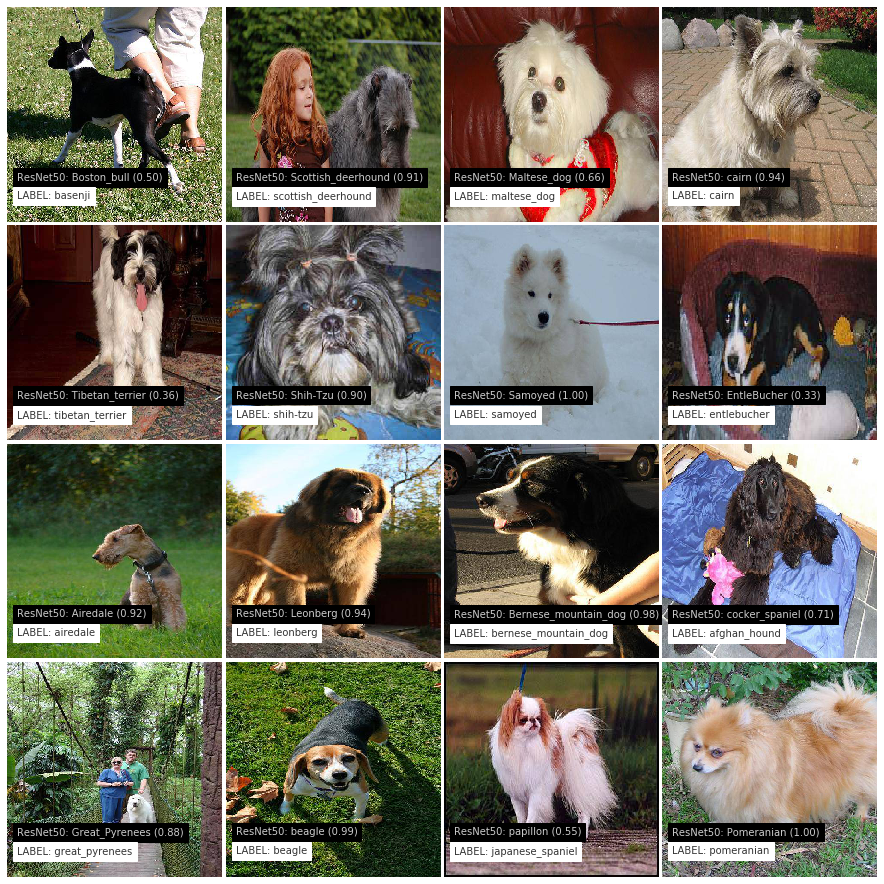

In [0]:
#model = ResNet50(weights='imagenet')
j = int(np.sqrt(NUM_CLASSES))
i = int(np.ceil(1. * NUM_CLASSES / j))
fig = plt.figure(1, figsize=(16, 16))
grid = ImageGrid(fig, 111, nrows_ncols=(i, j), axes_pad=0.05)
for i, (img_id, breed) in enumerate(labels.loc[labels['rank'] == 1, ['id', 'breed']].values):
    ax = grid[i]
    img = read_img(img_id, 'train', (224, 224))
    ax.imshow(img / 255.)
    x = preprocess_input(np.expand_dims(img.copy(), axis=0))
    preds = model.predict(x, callbacks=[tensorboard_callback])
    _, imagenet_class_name, prob = decode_predictions(preds, top=1)[0][0]
    ax.text(10, 180, 'ResNet50: %s (%.2f)' % (imagenet_class_name , prob), color='w', backgroundcolor='k', alpha=0.8)
    ax.text(10, 200, 'LABEL: %s' % breed, color='k', backgroundcolor='w', alpha=0.8)
    ax.axis('off')
plt.show()

### Tensorboard

In [0]:
%tensorboard --logdir logs/fit

Reusing TensorBoard on port 6006 (pid 640), started 0:01:28 ago. (Use '!kill 640' to kill it.)

##VGG16

In [0]:
INPUT_SIZE = 224
POOLING = 'avg'
x_train = np.zeros((len(labels), INPUT_SIZE, INPUT_SIZE, 3), dtype='float32')
for i, img_id in tqdm(enumerate(labels['id'])):
    img = read_img(img_id, 'train', (INPUT_SIZE, INPUT_SIZE))
    x = preprocess_input(np.expand_dims(img.copy(), axis=0))
    x_train[i] = x
print('Train Images shape: {} size: {:,}'.format(x_train.shape, x_train.size))

1777it [00:07, 228.64it/s]

Train Images shape: (1777, 224, 224, 3) size: 267,488,256


In [0]:
Xtr = x_train[train_idx]
Xv = x_train[valid_idx]
print((Xtr.shape, Xv.shape, ytr.shape, yv.shape))
vgg_bottleneck = VGG16(weights='imagenet', include_top=False, pooling=POOLING)
train_vgg_bf = vgg_bottleneck.predict(Xtr, batch_size=32, verbose=1)
valid_vgg_bf = vgg_bottleneck.predict(Xv, batch_size=32, verbose=1)
print('VGG train bottleneck features shape: {} size: {:,}'.format(train_vgg_bf.shape, train_vgg_bf.size))
print('VGG valid bottleneck features shape: {} size: {:,}'.format(valid_vgg_bf.shape, valid_vgg_bf.size))

((1409, 224, 224, 3), (368, 224, 224, 3), (1409, 16), (368, 16))
368/368 [==============================] - 1s 4ms/step
VGG train bottleneck features shape: (1409, 512) size: 721,408
VGG valid bottleneck features shape: (368, 512) size: 188,416


In [0]:
logreg = LogisticRegression(multi_class='multinomial', solver='lbfgs', random_state=SEED)
logreg.fit(train_vgg_bf, (ytr * range(NUM_CLASSES)).sum(axis=1))
valid_probs = logreg.predict_proba(valid_vgg_bf)
valid_preds = logreg.predict(valid_vgg_bf)

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:947: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)


In [0]:
print('Validation VGG LogLoss {}'.format(log_loss(yv, valid_probs)))
print('Validation VGG Accuracy {}'.format(accuracy_score((yv * range(NUM_CLASSES)).sum(axis=1), valid_preds)))

Validation VGG LogLoss 0.35218624736135107
Validation VGG Accuracy 0.9184782608695652


##Xception

In [0]:
INPUT_SIZE = 299
POOLING = 'avg'
x_train = np.zeros((len(labels), INPUT_SIZE, INPUT_SIZE, 3), dtype='float32')
for i, img_id in tqdm(enumerate(labels['id'])):
    img = read_img(img_id, 'train', (INPUT_SIZE, INPUT_SIZE))
    x = xception.preprocess_input(np.expand_dims(img.copy(), axis=0))
    x_train[i] = x
print('Train Images shape: {} size: {:,}'.format(x_train.shape, x_train.size))

1777it [00:07, 252.46it/s]

Train Images shape: (1777, 299, 299, 3) size: 476,596,731


In [0]:
Xtr = x_train[train_idx]
Xv = x_train[valid_idx]
print((Xtr.shape, Xv.shape, ytr.shape, yv.shape))
xception_bottleneck = xception.Xception(weights='imagenet', include_top=False, pooling=POOLING)
train_x_bf = xception_bottleneck.predict(Xtr, batch_size=32, verbose=1)
valid_x_bf = xception_bottleneck.predict(Xv, batch_size=32, verbose=1)
print('Xception train bottleneck features shape: {} size: {:,}'.format(train_x_bf.shape, train_x_bf.size))
print('Xception valid bottleneck features shape: {} size: {:,}'.format(valid_x_bf.shape, valid_x_bf.size))

((1409, 299, 299, 3), (368, 299, 299, 3), (1409, 16), (368, 16))
368/368 [==============================] - 2s 6ms/step
Xception train bottleneck features shape: (1409, 2048) size: 2,885,632
Xception valid bottleneck features shape: (368, 2048) size: 753,664


In [0]:
logreg = LogisticRegression(multi_class='multinomial', solver='lbfgs', random_state=SEED)
logreg.fit(train_x_bf, (ytr * range(NUM_CLASSES)).sum(axis=1))
valid_probs = logreg.predict_proba(valid_x_bf)
valid_preds = logreg.predict(valid_x_bf)
print('Validation Xception LogLoss {}'.format(log_loss(yv, valid_probs)))
print('Validation Xception Accuracy {}'.format(accuracy_score((yv * range(NUM_CLASSES)).sum(axis=1), valid_preds)))

Validation Xception LogLoss 0.0682340157530156
Validation Xception Accuracy 0.9809782608695652


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:947: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)


##Inception

In [0]:
Xtr = x_train[train_idx]
Xv = x_train[valid_idx]
print((Xtr.shape, Xv.shape, ytr.shape, yv.shape))
inception_bottleneck = inception_v3.InceptionV3(weights='imagenet', include_top=False, pooling=POOLING)
train_i_bf = inception_bottleneck.predict(Xtr, batch_size=32, verbose=1)
valid_i_bf = inception_bottleneck.predict(Xv, batch_size=32, verbose=1)
print('InceptionV3 train bottleneck features shape: {} size: {:,}'.format(train_i_bf.shape, train_i_bf.size))
print('InceptionV3 valid bottleneck features shape: {} size: {:,}'.format(valid_i_bf.shape, valid_i_bf.size))

((1409, 299, 299, 3), (368, 299, 299, 3), (1409, 16), (368, 16))

368/368 [==============================] - 2s 4ms/step
InceptionV3 train bottleneck features shape: (1409, 2048) size: 2,885,632
InceptionV3 valid bottleneck features shape: (368, 2048) size: 753,664


In [0]:
logreg = LogisticRegression(multi_class='multinomial', solver='lbfgs', random_state=SEED)
logreg.fit(train_i_bf, (ytr * range(NUM_CLASSES)).sum(axis=1))
valid_probs = logreg.predict_proba(valid_i_bf)
valid_preds = logreg.predict(valid_i_bf)

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:947: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)


In [0]:
print('Validation Inception LogLoss {}'.format(log_loss(yv, valid_probs)))
print('Validation Inception Accuracy {}'.format(accuracy_score((yv * range(NUM_CLASSES)).sum(axis=1), valid_preds)))

Validation Inception LogLoss 0.08069419683397454
Validation Inception Accuracy 0.967391304347826


In [0]:
X = np.hstack([train_x_bf, train_i_bf])
V = np.hstack([valid_x_bf, valid_i_bf])
print('Full train bottleneck features shape: {} size: {:,}'.format(X.shape, X.size))
print('Full valid bottleneck features shape: {} size: {:,}'.format(V.shape, V.size))
logreg = LogisticRegression(multi_class='multinomial', solver='lbfgs', random_state=SEED)
logreg.fit(X, (ytr * range(NUM_CLASSES)).sum(axis=1))
valid_probs = logreg.predict_proba(V)
valid_preds = logreg.predict(V)
print('Validation Xception + Inception LogLoss {}'.format(log_loss(yv, valid_probs)))
print('Validation Xception + Inception Accuracy {}'.format(accuracy_score((yv * range(NUM_CLASSES)).sum(axis=1), valid_preds)))

Full train bottleneck features shape: (1409, 4096) size: 5,771,264
Full valid bottleneck features shape: (368, 4096) size: 1,507,328
Validation Xception + Inception LogLoss 0.07081205757842379
Validation Xception + Inception Accuracy 0.9755434782608695


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:947: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)


#Misclassification/Wronlgy Labeled Data

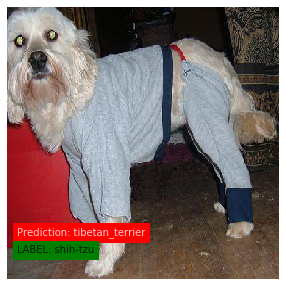

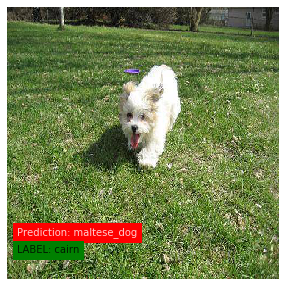

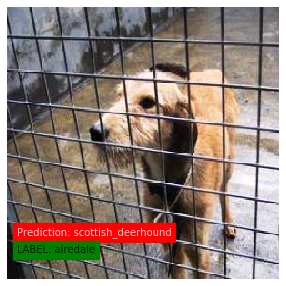

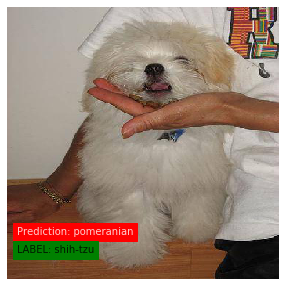

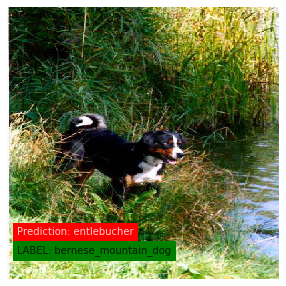

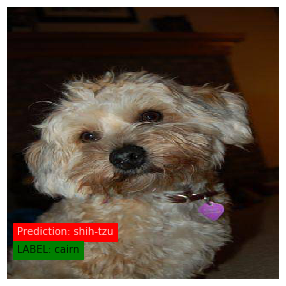

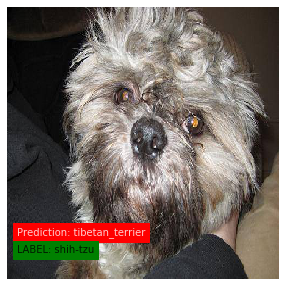

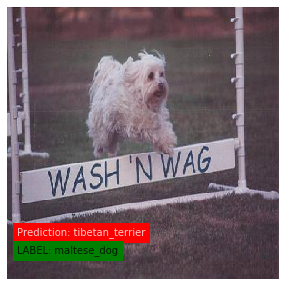

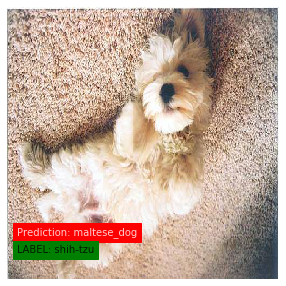

In [0]:
valid_breeds = (yv * range(NUM_CLASSES)).sum(axis=1)
error_idx = (valid_breeds != valid_preds)
for img_id, breed, pred in zip(labels.loc[valid_idx, 'id'].values[error_idx],
                                [selected_breed_list[int(b)] for b in valid_preds[error_idx]],
                                [selected_breed_list[int(b)] for b in valid_breeds[error_idx]]):
    fig, ax = plt.subplots(figsize=(5,5))
    img = read_img(img_id, 'train', (299, 299))
    ax.imshow(img / 255.)
    ax.text(10, 250, 'Prediction: %s' % pred, color='w', backgroundcolor='r', alpha=0.8)
    ax.text(10, 270, 'LABEL: %s' % breed, color='k', backgroundcolor='g', alpha=0.8)
    ax.axis('off')
    plt.show()  


#References

---


https://www.kaggle.com/gaborfodor/dog-breed-pretrained-keras-models-lb-0-3 <br>
https://www.kaggle.com/gaborfodor/keras-pretrained-models
